## 9. Web Scraping
Web scraping is the process of automatically extracting data from a website. This technique makes it possible to quickly collect and analyze large amounts of data without having to manually copy and paste data. It is useful in many fields, such as finance, marketing, and academic research, where efficiency in data collection is critical.<br><br>
In this notebook you will learn how to extract data from websites using a package called <b>Beautiful Soup</b>. Specifically, we will extract individual stock prices from the Yahoo Finance website as an example. We will also cover an integrated example that combines what we have learned in the previous notebooks to estimate a model called the Fama-French three factor model for each individual stock.<br><br>
<span style="color: red; ">Caution: This notebook only downloads a few HTML files from Yahoo Finance. Please avoid attempting to download large amounts of data, as this may be considered a DDOS attack.</span><br><br>
Please note that the HTML structure of Yahoo Finance may change. If this occurs, you will need to modify the code accordingly to execute the exercises in this notebook.

## 9.1. Basics of Web Scraping
### 9.1.1 Basics of HTML
To extract data from websites, you need to know how websites are created. Basically, a web page is a text file written in the language of HTML (HyperText Markup Language) which is the standard markup language for building webpages. HTML consists of specific elements called "tags," and these tags are used to define how text, images, and other content is displayed on a webpage.<br><br>
An HTML document typically has the following structure:

```html
<!DOCTYPE html>
<html>
<head>
    <title>The title of the page</title>
</head>
<body>
    <h1>This is heading 1</h1>
    <h2>This is heading 2</h2>
    <p>This is a paragraph.</p>
    <p>This is <br> a paragraph.</p>
    <a href="https://www.example.com">This is a link.</a> <b>
</body>
</html>
```
Most of tags begin with `<tag>` and end with `</tag>`. You can specify how that text will be displayed in the browser by placing text between the start and end tags. Sometimes, tags might be nested.<br>
Let's look at the basic structure of the above example, `<!DOCTYPE html>` declares this is an HTML document. All of contents of this document should be inside `<html>...</html>`. `<head>...</head>` contains meta information of this page, such as the title. Inside the `<head>` tag, you can specify the title by using `<title>` tag as shown above.<br>
The `<body>...</body>` tag contains elements that are actually displayed in the browser, which are typically more relevant for web scraping purposes. Let's see how the above example actually looks on the web browser:<br>
    <h1>This is heading 1</h1>
    <h2>This is heading 2</h2>
    <p>This is a paragraph.</p>
    <p>This is <br> a paragraph.</p>
    <a href="https://www.example.com">This is a link.</a>
<br><br>
The `<h1>` tag is typically used to create the main title on a page and the text inside the tag is displayed with a large font. The `<h2>` tag is used fo subheadings and the text is displayed with a font that is somewhat smaller than that of the `<h1>` tag. H-tags are available from `<h1>` to `<h6>`, each of which can be used for different levels of subheadings.(Note that typically, how a heading actually displays by h-tags is defined in a language called <i>CSS</i> by the author of the webpage. This also applies to other tags such as the p-tag explained below.)<br>
The `<p>` tag is used to create a paragraph. If you use a p-tag, an empty line is inserted before or after the paragraph, giving the appearance of a separate block. The `<br>` tag is used to insert a line break at an arbitrary position.<br>
The `<a>` tag is used to create a hyperlink. To specify the URL of the link, you write `href="https://www.example.com"` in the starting tag.<br><br>
Like `href` in the a-tag, HTML elements can have so-called <i>attributes</i>, which are used to specify how am HTML element behaves or is diplayed. HTML attributes are very important when doing web scraping because we can utilize them to tell the program where the desired information is located in the source. Typically, web scraping uses `id` and `class` which give names to HTML elements. For example, you may find the following p tag element in an HTML source:
```html
    <p id="main-data">This is the data you want.</p>
```
The author of this web page seems to have named the above p-tag element "main-data". If you want to extract the text in this p-tag, you can tell the program to "extract the text in the p-tag named 'main-data'".<br><br>
The table-tag is another important HTML element for webscraping. Data on web pages are often provided in tabular form, as is the case with the Yahoo Finance data discussed later.<br>
In HTML source, table tags are typically structured as follows:
```html
<table id="main-table">
    <tr>
        <th> Year </th> <th> GDP growth </th> <th> Inflation </th>
    </tr>
    <tr>
        <td> 2021 </td> <td> 5.9 </td> <td> 3.2 </td>
    </tr>
    <tr>
        <td> 2022 </td> <td> 1.9 </td> <td> 8.3 </td>
    </tr>
    <tr>
        <td> 2023 </td> <td> 2.5 </td> <td> 3.7 </td>
    </tr>
</table>
```
The above source will be displayed like this in browsers:
<table id="main-table">
    <tr>
        <th> Year </th> <th> GDP growth </th> <th> Inflation </th>
    </tr>
    <tr>
        <td> 2021 </td> <td> 5.9 </td> <td> 3.2 </td>
    </tr>
    <tr>
        <td> 2022 </td> <td> 1.9 </td> <td> 8.3 </td>
    </tr>
    <tr>
        <td> 2023 </td> <td> 2.5 </td> <td> 3.7 </td>
    </tr>
</table>

The table tag has the following four components: `<table>`: Create a table, `<tr>`: Create a row (tr=table row), `<th>`: Create a header cell (th=table header), `<td>`: Create a data cell (td=table data). All table elements must be written inside `<table>... </table>`, and `<th>` or `<td>` must be written within `<tr>... </tr>`.

### 9.1.2 Extracting Data from Yahoo Finance
Using the HTML knowledge above, let's learn step-by-step how to actually extract data from the web using a Yahoo Finance example. (Actually, APIs to retrieve data from Yahoo Finance are available, but we will stick to retrieving data from HTML data on our own for learning purposes.)<Br>
A program to extract data from HTML on the web typically consists of the following two steps:
<ul>
<li>Get an HTML file from the web as text</li>
<li>Analyze the HTML file and extract the data you want</li>
</ul>
In this notebook, the first step uses a package called <b>requests</b> and the second step uses a package called <b>BeautifulSoup</b>. If you have not already installed these, please do so.<br><br>
First, import the necessary packages as usual.

In [1]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
pd.options.mode.copy_on_write = True 

/var/folders/1k/hl21gvbs03jgz9c_qdy_fc000000gn/T/ipykernel_47273/780286468.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Next, download the HTML source using the <b>requests</b> package. Here we try to get price data for Apple's stock from the following URL. Please take a look at the webpage. The goal of this exercise is to retrieve the historical price data in the table.<br><br> 
https://finance.yahoo.com/quote/AAPL/history?period1=946684800&period2=1703980800

In [2]:
base_url = "https://finance.yahoo.com/quote/AAPL/history?period1=946684800&period2=1703980800"
headers = {
    'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/124.0.0.0 Safari/537.36'
}
response = requests.get(base_url, headers=headers)

The <b>requests.get()</b> function sends a request to retrive data from the URL specified in the first parameter. (More specifically, it sends a so-called <i>GET request</i>.) You may never have been aware of it, but when you browse a web page, you are sending a request to a web server and receiving content as a response. This function can do that explicitly and returns the response from the web server as an object.<br>
The function can specify the header of the request using the `header=` argument. When a request is made to a server to retrieve a web page, additional information about the sender of the request is sent. The 'User-Agent' field provides information about the user's web browsing environment and contains information about the user's OS and browser. If no User-Agent information is provided, the web server may reject it as a suspicious request, so it should be specified as in the code above. The above code specifies the environment of the author of this notebook as User-Agent (OS is Mac and browser is Google Chrome), but there is no need to change it even if you are in a different environment.<br><br>
The response object has the <b>.text</b> attribute that contains the text data of the content of the response. Let's take a look at the text data returned.

In [3]:
print(response.text)

<!doctype html>
<html lang="en-US" theme="light"  data-color-scheme="light" class="desktop neo-green dock-upscale">
    <head>
        <meta charset="utf-8" />
        <meta name="viewport" content="width=device-width, initial-scale=1" />
        <meta name="oath:guce:consent-host" content="guce.yahoo.com" />
        <link rel="preconnect" href="//s.yimg.com" crossorigin="anonymous"><link rel="preconnect" href="//geo.yahoo.com"/><link rel="preconnect" href="//query1.finance.yahoo.com"/><link rel="preconnect" href="//query2.finance.yahoo.com"/><link rel="preconnect" href="//consent.cmp.oath.com"/><link rel="preload" href="/__rapidworker-1.2.js" as="worker"/><link rel="preconnect" href="https://s.yimg.com/uc/finance/webcore/js/_staticFinProtobuf.4b1559b8e4645fd93a12.js"/><link rel="preconnect" href="https://cdn.jsdelivr.net/npm/protobufjs@7.1.2/dist/minimal/protobuf.min.js"/><script>window.finNeoPageStart = Date.now();</script><script>(function(){if(!window.YAHOO){window.YAHOO={}}; windo

As shown above, we successfully retrieved the HTML text data from the URL.<br><br>
Since a web page contains a huge amount of HTML elements it is typically difficult to handle it on your own. The package called <b>BeautifulSoup</b> automatically analyzes and decomposes HTML data into individual elements (i.e., parsing) making it easy to extract the information you want.<br><br>
In the following code, the HTML text obtained above is converted into a BeautifulSoup object using the <b>BeautifulSoup()</b> function.

In [4]:
soup = BeautifulSoup(response.text, 'html.parser')
soup

<!DOCTYPE html>

<html class="desktop neo-green dock-upscale" data-color-scheme="light" lang="en-US" theme="light">
<head>
<meta charset="utf-8"/>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<meta content="guce.yahoo.com" name="oath:guce:consent-host"/>
<link crossorigin="anonymous" href="//s.yimg.com" rel="preconnect"/><link href="//geo.yahoo.com" rel="preconnect"><link href="//query1.finance.yahoo.com" rel="preconnect"/><link href="//query2.finance.yahoo.com" rel="preconnect"/><link href="//consent.cmp.oath.com" rel="preconnect"/><link as="worker" href="/__rapidworker-1.2.js" rel="preload"/><link href="https://s.yimg.com/uc/finance/webcore/js/_staticFinProtobuf.4b1559b8e4645fd93a12.js" rel="preconnect"/><link href="https://cdn.jsdelivr.net/npm/protobufjs@7.1.2/dist/minimal/protobuf.min.js" rel="preconnect"/><script>window.finNeoPageStart = Date.now();</script><script>(function(){if(!window.YAHOO){window.YAHOO={}}; window.YAHOO.context={"consent":{"allowConte

At first glance, nothing seems to have changed, but this object has convenient methods that allow easy access to each HTML element.<br><br>
Here we need to manually identify which of the elements of the web page we want to extract. Again, the goal of this exercise is to retrieve the historical price data in the table. The best way to analyze HTML data is to locate the data you want using the developer tools provided with your browser. Let's first opent the URL with your brower. For example, in Google Chrome, right-click on the webpage you want to analyze and choose "inspection" to open the developer tool window. The "Elements" tab displays the HTML source code of the webpage. What makes this tool useful is that by hovering your mouse over a line of the source code, it will highlight which part of the webpage corresponds to the line. Other browsers have similar tools.
<Br><br>Please see the following image. Using the developer tools, we can see that the stock price data we want to extract is contained in a `<table>` tag that has a `class` attribute specified as `table yf-ewueuo`.<br><br>
<img src="nb9_screen.png" width="80%">
<br><br>
Recall that this HTML source code is already stored in `soup` as a BeautifulSoup object. You can easily extract this table from the HTML code by using the <b>.find()</b> method as follows:

In [7]:
table = soup.find('table', {'class': 'table yf-ewueuo'})
table

<table class="table yf-ewueuo"><thead><tr class="yf-ewueuo"><th class="yf-ewueuo">Date  </th><th class="yf-ewueuo">Open  </th><th class="yf-ewueuo">High  </th><th class="yf-ewueuo">Low  </th><th class="yf-ewueuo">Close   <span class="container yf-7dju6j"><div class="icon fin-icon primary-icn sz-medium tw-align-text-top yf-7v4gbg"><!-- HTML_TAG_START --><svg viewbox="0 0 24 24" xmlns="http://www.w3.org/2000/svg"><path d="M11 7h2v2h-2zm0 4h2v6h-2zm1-9C6.48 2 2 6.48 2 12s4.48 10 10 10 10-4.48 10-10S17.52 2 12 2m0 18c-4.41 0-8-3.59-8-8s3.59-8 8-8 8 3.59 8 8-3.59 8-8 8"></path></svg><!-- HTML_TAG_END --></div> <div class="tooltip al-bottom yf-7dju6j" role="tooltip"><div class="arrow yf-7dju6j"></div> <h3 class="title yf-7dju6j"></h3> <span class="toolTipContent yf-ewueuo" slot="content">Close price adjusted for splits. </span></div> </span> </th><th class="yf-ewueuo">Adj Close   <span class="container yf-7dju6j"><div class="icon fin-icon primary-icn sz-medium tw-align-text-top yf-7v4gbg"><!

In the <b>.find()</b> method, the first parameter specifies the tag and the second parameter the attributes of the tag as a dictionary. If an HTML source contains multiple elements that satisfy this condition, only the first element is extracted. (For this exercise, I confirmed that `<table class="table svelte-ewueuo">` is unique in this source.) The <b>.find()</b> method returns a new BeautifulSoup object.<br><br>
Moreover, let's decompose the elements contained in this table tag and store them in a dataframe. As explained earlier, each row in a table tag is stored in `<tr>` tags. You can extract each row from the table by using the <b>.find_all()</b> method. This method is basically the same as the <b>.find()</b> method, but it extracts all HTML elements that satisfy the condition and stores them in a list. The code below extracts all the tr-tags contained in the table and stores them in the `rows` list.

In [8]:
rows = table.find_all('tr')
rows

[<tr class="yf-ewueuo"><th class="yf-ewueuo">Date  </th><th class="yf-ewueuo">Open  </th><th class="yf-ewueuo">High  </th><th class="yf-ewueuo">Low  </th><th class="yf-ewueuo">Close   <span class="container yf-7dju6j"><div class="icon fin-icon primary-icn sz-medium tw-align-text-top yf-7v4gbg"><!-- HTML_TAG_START --><svg viewbox="0 0 24 24" xmlns="http://www.w3.org/2000/svg"><path d="M11 7h2v2h-2zm0 4h2v6h-2zm1-9C6.48 2 2 6.48 2 12s4.48 10 10 10 10-4.48 10-10S17.52 2 12 2m0 18c-4.41 0-8-3.59-8-8s3.59-8 8-8 8 3.59 8 8-3.59 8-8 8"></path></svg><!-- HTML_TAG_END --></div> <div class="tooltip al-bottom yf-7dju6j" role="tooltip"><div class="arrow yf-7dju6j"></div> <h3 class="title yf-7dju6j"></h3> <span class="toolTipContent yf-ewueuo" slot="content">Close price adjusted for splits. </span></div> </span> </th><th class="yf-ewueuo">Adj Close   <span class="container yf-7dju6j"><div class="icon fin-icon primary-icn sz-medium tw-align-text-top yf-7v4gbg"><!-- HTML_TAG_START --><svg viewbox="0 

Further, extract the `<th>` or `<td>` tags for each row and break the rows down to the level of each cell. For example, the first row (i.e. `rows[0]`) contains the header of the table. Using the <b>.find_all()</b> method again, we can extract all of the `<th>` tags in the first row as follows:

In [9]:
header_row = rows[0].find_all('th')
header_row

[<th class="yf-ewueuo">Date  </th>,
 <th class="yf-ewueuo">Open  </th>,
 <th class="yf-ewueuo">High  </th>,
 <th class="yf-ewueuo">Low  </th>,
 <th class="yf-ewueuo">Close   <span class="container yf-7dju6j"><div class="icon fin-icon primary-icn sz-medium tw-align-text-top yf-7v4gbg"><!-- HTML_TAG_START --><svg viewbox="0 0 24 24" xmlns="http://www.w3.org/2000/svg"><path d="M11 7h2v2h-2zm0 4h2v6h-2zm1-9C6.48 2 2 6.48 2 12s4.48 10 10 10 10-4.48 10-10S17.52 2 12 2m0 18c-4.41 0-8-3.59-8-8s3.59-8 8-8 8 3.59 8 8-3.59 8-8 8"></path></svg><!-- HTML_TAG_END --></div> <div class="tooltip al-bottom yf-7dju6j" role="tooltip"><div class="arrow yf-7dju6j"></div> <h3 class="title yf-7dju6j"></h3> <span class="toolTipContent yf-ewueuo" slot="content">Close price adjusted for splits. </span></div> </span> </th>,
 <th class="yf-ewueuo">Adj Close   <span class="container yf-7dju6j"><div class="icon fin-icon primary-icn sz-medium tw-align-text-top yf-7v4gbg"><!-- HTML_TAG_START --><svg viewbox="0 0 24 24

As mentioned above, the object returned by the <b>.find()</b> and <b>.find_all()</b> methods is a BeautifulSoup object, which contains both tag information and text to be displayed. Ulitimately we only need the text information, so let's extract it using the <b>.text</b> attributes.

In [10]:
header_row[0].text.strip()  # use strip() method to remove unnecessary spaces

'Date'

Using list comprehension, we can extract all of the headers and store them in a list with a single line of code.

In [11]:
column_names = [cell.text.strip() for cell in header_row]
column_names

['Date',
 'Open',
 'High',
 'Low',
 'Close      Close price adjusted for splits.',
 'Adj Close      Adjusted close price adjusted for splits and dividend and/or capital gain distributions.',
 'Volume']

You can get cell-by-cell data for the second and subsequent rows as well. Note that after the second line, you need to extract the td-tag instead the th-tag.

In [12]:
cols = rows[1].find_all('td')
cols

[<td class="yf-ewueuo">Dec 29, 2023</td>,
 <td class="yf-ewueuo">193.90</td>,
 <td class="yf-ewueuo">194.40</td>,
 <td class="yf-ewueuo">191.73</td>,
 <td class="yf-ewueuo">192.53</td>,
 <td class="yf-ewueuo">191.80</td>,
 <td class="yf-ewueuo">42,628,800</td>]

In [13]:
cols_text = [ele.text.strip() for ele in cols]
cols_text

['Dec 29, 2023',
 '193.90',
 '194.40',
 '191.73',
 '192.53',
 '191.80',
 '42,628,800']

Note that these data are stored as text, not numbers, and therefore you need to convert them into numbers later.<br><br>
Let's apply the above process to each row in a loop and store the results in a list and then convert it into a dataframe

In [14]:
data = []
for i in range(1,len(rows)):
    row = rows[i]
    cols = row.find_all('td')
    cols_text = [ele.text.strip() for ele in cols]
    data.append([ele for ele in cols_text if ele])  # empty row will be removed
    
# convert the list into a dataframe
df = pd.DataFrame(data, columns=column_names)
df

,Date,Open,High,Low,Close Close price adjusted for splits.,Adj Close Adjusted close price adjusted for splits and dividend and/or capital gain distributions.,Volume
0,"Dec 29, 2023",193.90,194.40,191.73,192.53,191.80,"42,628,800"
1,"Dec 28, 2023",194.14,194.66,193.17,193.58,192.85,"34,049,900"
2,"Dec 27, 2023",192.49,193.50,191.09,193.15,192.42,"48,087,700"
3,"Dec 26, 2023",193.61,193.89,192.83,193.05,192.32,"28,919,300"
4,"Dec 22, 2023",195.18,195.41,192.97,193.60,192.87,"37,122,800"
...,...,...,...,...,...,...,...
6082,"Jan 7, 2000",0.86,0.90,0.85,0.89,0.75,"460,734,400"
6083,"Jan 6, 2000",0.95,0.96,0.85,0.85,0.72,"767,972,800"
6084,"Jan 5, 2000",0.93,0.99,0.92,0.93,0.78,"778,321,600"
6085,"Jan 4, 2000",0.97,0.99,0.90,0.92,0.77,"512,377,600"


Basically we are done. Let's modify the dataframe a bit to make it more useful for later data analysis. Since we will use the price series adjusted for stock splits and dividend payments, we will change the column name to "Price" and drop other series. Then we convert the "Date" column to a datetime object and then sort the data in ascending date order. We also need to convert "Price" series from text to numbers.

In [18]:
df.rename(columns={'Adj Close      Adjusted close price adjusted for splits and dividend and/or capital gain distributions.': 'Price'}, inplace=True)
df = df[['Date', 'Price']]
df['Date'] = pd.to_datetime(df['Date'])
df.sort_values(by=['Date'], inplace=True)
df.reset_index(drop=True, inplace=True)
df['Price'] = pd.to_numeric(df['Price'], errors='coerce')
df

,Date,Price
0,2000-01-03,0.84
1,2000-01-04,0.77
2,2000-01-05,0.78
3,2000-01-06,0.72
4,2000-01-07,0.75
...,...,...
6082,2023-12-22,192.87
6083,2023-12-26,192.32
6084,2023-12-27,192.42
6085,2023-12-28,192.85


### 9.2. Integrated Example
This section integrates the web-scraping techniques learned in the previous section with the regression analysis learned in Notebook 6, and provides an exercise in estimating a Fama-French 3-factor model.

#### Fama-French Three-Factor Model
The Fama-French three-factor model is a model that uses three factors to explain the return of a portfolio or individual stock. Specifically, the following three factors are used:
<ul>
<li>The excess return of the market portfolio</li>
<li>The excess return of the stock of small firms compared to large firms (SMB = Small Minus Big)</li>
<li>The excess return of the stock of firms with a high book value-to-market compared to firms with a low book value-to-market (HML = High Minus Low)</li>
</ul><br>
Put another way, the model explains stock returns in terms of three factors: market factor, size factor (SMB), and value factor (HML). It is known that small stocks tend to have larger returns than large stocks and that value stocks (i.e., stocks with high book-to-market ratios) tend to have larger returns than growth stocks (i.e., stocks with low book-to-market ratios). The SMB and HML factors reflect these anomalies, respectively. This model is based on the idea that by including these factors as explanatory variables in addition to excess market returns, individual stock anomalies can be captured by their sensitivity to these factors.<br><br>
Specifically, the specification of this model is as follows:

$$
R_i-R_f=a_i+b_i(R_M-R_f)+s_iSMB+h_iHML+\epsilon_i
$$
where $R_i$, $R_M$, and $R_f$ denote return of stock $i$, market return, and risk free rate respectively. <Br><br>

In this exercise, we will estimate the above equation for several individual stocks and analyze the characteristics of each stock. The stock price data is obtained from Yahoo Finance by web scraping as we learned in the previous section. Fortunately, all other data can be downloaded from the following website of Professor French:<br>
https://mba.tuck.dartmouth.edu/pages/faculty/ken.french/data_library.html<br>
(The data is saved in the same folder as this notebook under the name 'Factors.csv', so you do not need to download it.)

#### Estimation
First, import the necessary packages as usual. In this exercise, as in Notebook 6, we use the statsmodels package to perform regression analysis.

In [19]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm

Next, implement the web scraping part. Basically, the code will be the same as the previous section, but this time we will retrieve the stock prices of several companies, while the previous section retrieved only the stock prices of Apple.<br><br>
The key to doing this is to analyze the URL and find patterns. The following is the URL for Apple's stock price:<br>
https://finance.yahoo.com/quote/AAPL/history?period1=946684800&period2=1703980800<br>
Looking at this URL, it appears that 'AAPL' specifies the company of which stock price is displayed on this webpage. In fact, by entering here a stock identifier called <i>ticker</i>, you can access the stock price data you desire.<br><br>
For example, Amazon's ticker is "AMZN". Just replacing "AAPL" with "AMZN" in the URL above, you can access Amazon's stock price page.<br>
https://finance.yahoo.com/quote/AMZN/history?period1=946684800&period2=1703980800<br><br>
Utilizing this pattern, we define a function that retrieves stock price data from Yahoo Finance by taking a ticker name as input and returns it as a dataframe. This function simply repeats the code from the previous section, except that the URL changes according to ticker.

In [24]:
def retrieve_hp(ticker):
    
    base_url = f"https://finance.yahoo.com/quote/{ticker}/history?period1=946684800&period2=1703980800"
    headers = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/124.0.0.0 Safari/537.36'}
    response = requests.get(base_url, headers=headers)
    soup = BeautifulSoup(response.text, 'html.parser')
    table = soup.find('table', {'class': 'table yf-ewueuo'})

    rows = table.find_all('tr')

    column_names = [th.text.strip() for th in rows[0].find_all('th')]

    data = []
    for i in range(1,len(rows)):
        row = rows[i]
        cols = row.find_all('td')
        cols_text = [ele.text.strip() for ele in cols]
        data.append([ele for ele in cols_text if ele])

    df = pd.DataFrame(data, columns=column_names)
    
    df.rename(columns={'Adj Close      Adjusted close price adjusted for splits and dividend and/or capital gain distributions.': 'Price'}, inplace=True)
    df = df[['Date', 'Price']]
    df['Date'] = pd.to_datetime(df['Date'])
    df.sort_values(by=['Date'], inplace=True)
    df.reset_index(drop=True, inplace=True)
    df['Price'] = pd.to_numeric(df['Price'], errors='coerce')

    return df

Just to be sure, let's make sure this function works properly.

In [25]:
retrieve_hp('AMZN')

,Date,Price
0,2000-01-03,4.47
1,2000-01-04,4.10
2,2000-01-05,3.49
3,2000-01-06,3.28
4,2000-01-07,3.48
...,...,...
6033,2023-12-22,153.42
6034,2023-12-26,153.41
6035,2023-12-27,153.34
6036,2023-12-28,153.38


As you cann see above, it's working properly. <br><br>
In this exercise, we analyze stock price data for six companies: Amazon, Apple, Google, Tesla, Microsoft, and NVIDIA. The tickers for each company are as follows.

In [26]:
ticker_list = ['AMZN', 'AAPL', 'GOOGL', 'TSLA', 'MSFT', 'NVDA']

Also, read the factor data downloaded from Prof. French's website.

In [27]:
df_ff = pd.read_csv('Factors.csv')
df_ff['Date'] = pd.to_datetime(df_ff['Date'], format='%Y%m%d')
df_ff

,Date,Mkt-RF,SMB,HML,RF
0,1926-07-01,0.10,-0.25,-0.27,0.009
1,1926-07-02,0.45,-0.33,-0.06,0.009
2,1926-07-06,0.17,0.30,-0.39,0.009
3,1926-07-07,0.09,-0.58,0.02,0.009
4,1926-07-08,0.21,-0.38,0.19,0.009
...,...,...,...,...,...
25705,2024-03-22,-0.23,-0.87,-0.53,0.021
25706,2024-03-25,-0.26,-0.24,0.88,0.021
25707,2024-03-26,-0.26,0.09,-0.13,0.021
25708,2024-03-27,0.88,1.04,0.91,0.021


Finally, we estimate the Fama-French model for each stock. The following code loops through each ticker and stores the coefficients of each factor in dictionaries (`params_Mkt`, `params_SMB`, and `params_HML`).

In [28]:
params_Mkt = {}
params_SMB = {}
params_HML = {}

for ticker in ticker_list:
    
    # Get stock price data from Yahoo Finance
    df = retrieve_hp(ticker)

    # Calculate return
    # shift(1) shifts the series by one row
    df['Return'] = (df['Price'] - df['Price'].shift(1)) / df['Price'].shift(1) * 100

    # merge the stock price data with the factor data
    df = pd.merge(df, df_ff, on='Date')
    # calculate excess return of the stock
    df['Excess_Return'] = df['Return'] - df['RF']

    # run regression
    df = df[['Excess_Return', 'Mkt-RF', 'SMB', 'HML']].dropna()
    y = df['Excess_Return']
    X = df[['Mkt-RF', 'SMB', 'HML']]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()

    # store the parameters
    params_Mkt[ticker] = model.params['Mkt-RF']
    params_SMB[ticker] = model.params['SMB']
    params_HML[ticker] = model.params['HML']


Now, vidualize the results.

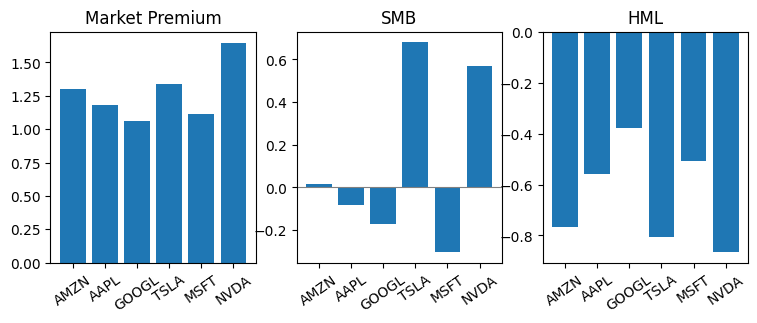

In [29]:
plt.figure(figsize=(9,3))

plt.subplot(1,3,1)
plt.title('Market Premium')
plt.bar(params_Mkt.keys(),  params_Mkt.values())
plt.xticks(rotation = 35)

plt.subplot(1,3,2)
plt.title('SMB')
plt.bar(params_SMB.keys(),  params_SMB.values())
plt.axhline(0, color='gray', linewidth=0.8)
plt.xticks(rotation = 35)

plt.subplot(1,3,3)
plt.title('HML')
plt.bar(params_HML.keys(),  params_HML.values())
plt.xticks(rotation = 35)

plt.show()

All of these stocks are considered to be classified as large growth stocks.　Hence, the fact that the coefficients of HML are all negative is consistent with this classification. Interestingly, however, looking at the SMB coefficients, the stock prices of Tesla and NVIDIA tend to move in tandem with those of small-cap stocks.